# Title of Your Group Project

This Python notebook serves as a template for your group project on Experiment 2: *Task switching with letters and numbers* for the course 'Modeling in Cognitive Science'.
This is the practical part of the group project where you get to implement the computational modeling workflow. In this part, you are expected to:


*   Implement at least two computational models relevant for your hypothesis. *(3 points)*
*   Simulate behavior from the two models. *(3 points)*
*   Implement a procedure for fitting the models to data. *(4 points)*
*   Implement a procedure for parameter recovery. *(5 points)*
*   (Implement a procedure for model recovery.) *(optional; 2 bonus points)*
*   Implement a model comparison. *(5 points)*.

You can gain a total of 20 points for the practical part of the group project.

**Note:** *Some of the exercises below (e.g. Model Simulation) rely on code from previous exercises (e.g., Model Implementation). In such cases, you are encouraged to rely on functions implemented for previous exercises. That is, you don't have to produce redundant code.*


For more information, you can check the task's GitHub repository:
[task switching with letter and numbers](https://github.com/snamazova/task_switch)


## Data Loading


In [17]:
import os

COLAB = False
if os.getenv("COLAB_RELEASE_TAG"):
   print("Running in Colab")
   !pip install ipywidgets
   !pip install git+https://github.com/lnccbrown/HSSM.git
   from google.colab import files
   import hssm
   import hssm.plotting
   COLAB = True
   
else:
   print("NOT in Colab")

NOT in Colab


In [18]:
import json
import pandas as pd
from data_cleaning import clean_data

# upload the file manually
file_name = "data/example.json"
if COLAB:
    uploaded = files.upload()
    # get the filename from the uploaded dictionary
    file_name = list(uploaded.keys())[0]

# open and load the JSON file
with open(file_name, "r") as f:
    data = json.load(f)

# convert JSON to a DataFrame
df_raw = pd.json_normalize(data)

# display the DataFrame columns to analyze it
print(df_raw.columns)
df_raw.head(1)

Index(['rt', 'stimulus', 'response', 'trial_type', 'trial_index',
       'time_elapsed', 'internal_node_id', 'bean_trial_duration',
       'bean_duration', 'bean_stimulus', 'bean_choices', 'bean_correct_key',
       'bean_type', 'bean_text', 'bean_color', 'bean_correct',
       'bean_num_correct', 'bean_accuracy', 'bean_task_type'],
      dtype='object')


,rt,stimulus,response,trial_type,trial_index,time_elapsed,internal_node_id,bean_trial_duration,bean_duration,bean_stimulus,bean_choices,bean_correct_key,bean_type,bean_text,bean_color,bean_correct,bean_num_correct,bean_accuracy,bean_task_type
0,648.0,<div style='color:white'>Welcome to our task-s...,,html-keyboard-response,0,649,0.0-0.0-0.0,NaN,NaN,<div style='color:white'>Welcome to our task-s...,[ ],,jsPsychHtmlKeyboardResponse,Welcome to our task-switching experiment.What ...,white,False,NaN,NaN,NaN


### DataFrame Structure Overview

The DataFrame contains multiple columns representing various aspects of a **task-switching experiment**. Below is a breakdown of the key columns:  

## 1. General Trial Information  
- **`trial_index`**: The index of the current trial in the experiment(feedback is also considered as trial)  
- **`trial_type`**: The type of trial, indicating how the response was made (e.g., via keyboard or mouse click).  
- **`time_elapsed`**: The total time elapsed (in milliseconds) since the start of the experiment.  
- **`internal_node_id`**: An internal identifier for the trial structure.  

## 2. Response and Stimulus Data  
- **`stimulus`**: The presented stimulus for the trial.  
- **`response`**: The participant’s response/input during the trial.  
- **`rt`**: The reaction time (in milliseconds) taken to respond.  

## 3. Task-Specific Information (Task-Switching Task)   
- **`bean_trial_duration`**: The duration of the bean trial  
- **`bean_duration`**: The time the bean stimulus was displayed (with a maximum duration of 2000ms; if no response is given within this time, the trial automatically switches to the next one and is considered incorrect).
- **`bean_stimulus`**: The presented stimulus for the trial.  
- **`bean_choices`**: The available choice options in the trial.  
- **`bean_correct_key`**: The correct key (button press) for the task.  
- **`bean_type`**: The category of the bean stimulus, determined by how the participant responded (e.g., clicking or pressing a key)
- **`bean_text`**: A text representation of the bean (stimulus is inside `div` tag).  
- **`bean_color`**: The color of the bean
- **`bean_correct`**: A boolean or categorical value indicating whether the response was correct.  
- **`bean_num_correct`**: The number of correct responses across trials.  
- **`bean_accuracy`**: The participant's accuracy in the task, typically computed as the proportion of correct responses.  
- **`bean_task_type`**: The type of task being performed within the task-switching paradigm(letter or number task)


In [19]:
data_cleaned = clean_data(df_raw)
# data_cleaned.head(5)
data_cleaned.tail(5)

 data cleaning done. number of valid trails: 93


,task,trial_type,response,accuracy,choice_adjusted,rt,switch,participant_response,correct_key,key_choices,stimuli
88,letter,switch,1,0.887640,0,2.270,1,n,n,"[b, n]",E2
89,number,switch,1,0.888889,1,2.280,1,b,b,"[b, n]",K9
90,letter,switch,1,0.890110,0,1.741,1,n,n,"[b, n]",A2
91,letter,repeat,1,0.891304,0,0.857,0,b,b,"[b, n]",G5
92,letter,repeat,1,0.892473,0,0.921,0,n,n,"[b, n]",U6


In [20]:
# save to csv file, with a unique timeestamp
import datetime
timestamp = datetime.datetime.now().strftime("%m%d_%H%M")
# create folder data_cleaned if it does not exist
directory = "data_cleaned"
os.makedirs(directory, exist_ok=True)
filename = f"data_cleaned_{timestamp}.csv"
data_cleaned.to_csv(os.path.join(directory, filename), index=False)

# download the saved csv
if COLAB:
    files.download(filename)

## Model Implementation *(3 points)*

For this exercise you should:

*   Implement and simulate data from two* models that are suitable to test your hypothesis. *(3 points)*

<font size=2>*You may implement more than two models if you wish. However, two models are sufficient for this group project.</font>

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


### Model Formulation

### Insight into the latent varaibles in a simulation on one trial

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from model import simulate_dynamics, plot_trajectory

In [22]:
from ipywidgets import interact, widgets
def interactive_plot(g, alpha, gamma, x1_0, x2_0, P_0):

    I1 = 1        # Input to task 1
    I2 = 0        # Input to task 2
    sigma = 0.4    # noise
    T = 8         # Simulation time

    x_0 = [x1_0, x2_0, P_0]

    input = [I1, I2]
    np.random.seed(0)

    # Run the simulation
    ts, x1, x2, P  = simulate_dynamics(T, x_0, g, alpha, gamma, input, sigma, num_sample_points=100)

    # Plot the trajectory
    plot_trajectory(T, ts, x1, x2, P)

# Create interactive sliders
g_slider = widgets.FloatSlider(value=0.5, min=0.0, max=10.0, step=0.5, description="Gain (g):")
alpha_slider = widgets.FloatSlider(value=0.5, min=0.0, max=2, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.5, min=-2.0, max=2.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_silder = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")

# Use the interact function to create the interactive plot
interact(interactive_plot, g=g_slider, alpha=alpha_slider, gamma=gamma_slider ,x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_silder);

interactive(children=(FloatSlider(value=0.5, description='Gain (g):', max=10.0, step=0.5), FloatSlider(value=0…

## Model Simulation *(3 points)*

For this exercise you should:

*   Simulate data from both models for a single set of parameters. The simulation should mimic the experiment you are trying to model. *(2 points)*

*   Plot the simulated behavior of both models. The model plots should depict key features of the behavioral data, convincing yourself that the models are suitable to capture the data. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


In [23]:
from model_simulation import simulate_experiment


### Insight into the Dynamics of the two Models across trails

Ploting first 20 trails:


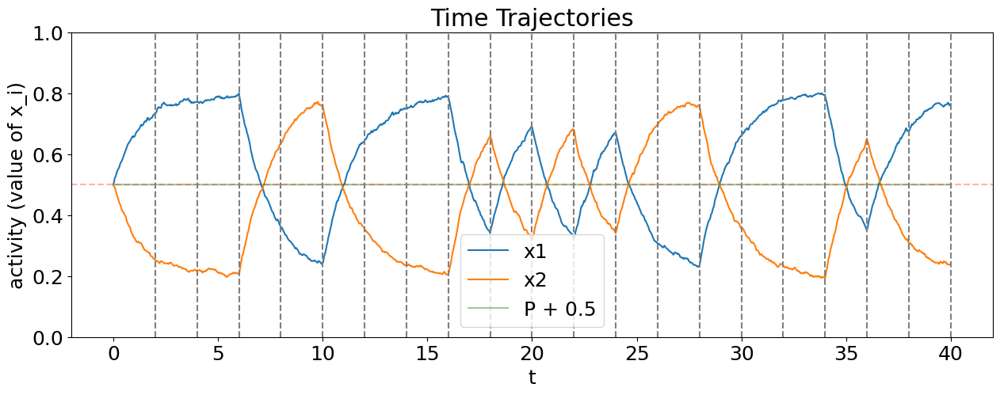

Ploting first 20 trails:


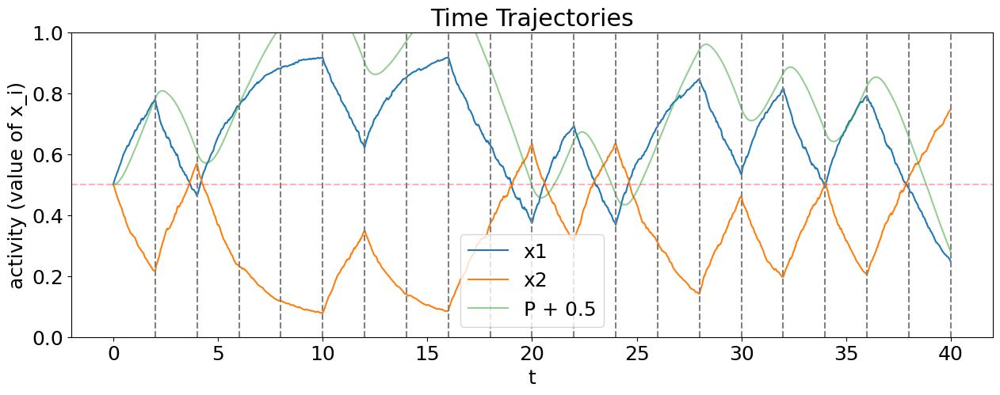

In [24]:
# simulating a small sample of trials to get an insight into the dynamics for both models
seed = 40
num_trials = 100
T = 2

sigma = 0.2
g = 1.75
c = 0.0

alpha = 1.0
gamma = 0.8

x_0 = [0.5, 0.5, 0]
# Base Model
np.random.seed(seed)
data_Base = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, bool_plot_trajectory = True)

# Perseverence Model
np.random.seed(seed)
data_P = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, bool_plot_trajectory = True)

### Surrogate Data from the two Models



In [25]:
# printing samples of the surrogate data

print("Surregate Data from Base Model:")
display(data_Base.head(10))

print("Surregate Data from Perserverance Model:")
display(data_P.head(10))

print('accuracy base: ', data_Base['accuracy'].iloc[-1])
print('accuracy perseverance: ', data_P['accuracy'].iloc[-1])

Surregate Data from Base Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,letter,repeat,1,1.0,0,0.772332,0.218551,"[1, 0]",1
1,letter,repeat,1,1.0,0,0.799205,0.205396,"[1, 0]",2
2,number,switch,1,1.0,1,0.359795,0.633954,"[0, 1]",3
3,number,repeat,1,1.0,1,0.241901,0.761674,"[0, 1]",4
4,letter,switch,1,1.0,0,0.644989,0.354624,"[1, 0]",5
5,letter,repeat,1,1.0,0,0.753208,0.236075,"[1, 0]",6
6,letter,repeat,1,1.0,0,0.790039,0.203014,"[1, 0]",7
7,number,switch,1,1.0,1,0.341004,0.660277,"[0, 1]",8
8,letter,switch,1,1.0,0,0.689518,0.318286,"[1, 0]",9
9,number,switch,0,0.9,0,0.323532,0.679952,"[0, 1]",10


Surregate Data from Perserverance Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,number,switch,1,1.0,1,0.462793,0.568169,"[0, 1]",1
1,letter,switch,1,1.0,0,0.757989,0.233824,"[1, 0]",2
2,letter,repeat,1,1.0,0,0.881008,0.118553,"[1, 0]",3
3,letter,repeat,1,1.0,0,0.916987,0.078635,"[1, 0]",4
4,number,switch,1,1.0,1,0.619628,0.350374,"[0, 1]",5
5,letter,switch,1,1.0,0,0.851763,0.139620,"[1, 0]",6
6,letter,repeat,1,1.0,0,0.918092,0.085319,"[1, 0]",7
7,number,switch,1,1.0,1,0.631748,0.370546,"[0, 1]",8
8,number,repeat,1,1.0,1,0.374110,0.633668,"[0, 1]",9
9,letter,switch,0,0.9,1,0.694291,0.313411,"[1, 0]",10


accuracy base:  0.8181818181818182
accuracy perseverance:  0.7373737373737373


### Behavioral insight (plots) of the two models

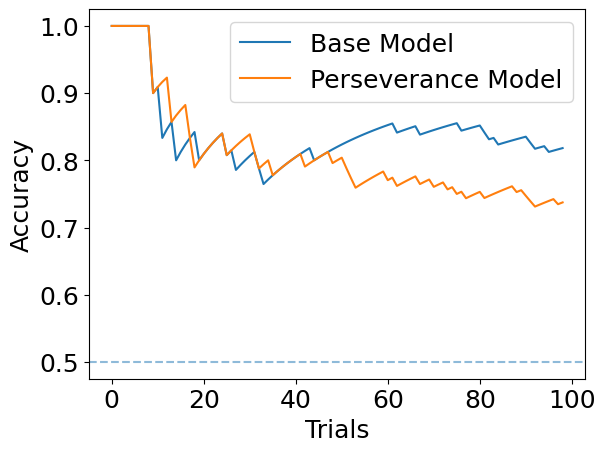

In [26]:
# plot accuary over trails for both models
plt.plot(data_Base['accuracy'], label='Base Model')
plt.plot(data_P['accuracy'], label='Perseverance Model')
plt.axhline(0.5, xmin=0, xmax=len(data_P), linestyle='--', alpha=0.5) # chance level
plt.xlabel('Trials')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Parameter Fitting *(4 points)*

For this exercise you should:

*   Set up a suitable parameter search space *(1 point)*

*   Implement a procedure to evaluate the fit of a model based on data *(2 points)*

*   Implement a procedure for searching the parameter space. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.



In [27]:
from parameter_fitting import param_fit_grid_search, param_fit_grid_search_parallel, plot_heatmap

### Fitting the two models to either surregate or participant data

In [28]:
# Parameter Fitting
seed = 40
np.random.seed(seed)
# search space over parameters T and g (sigma and c are assumed to be known)
num_samples = 4
min_g, max_g = 0, 8
min_c, max_c = -2, 2
min_alpha, max_alpha = 0, 4
min_gamma, max_gamma = -3, 3

c_values = np.linspace(min_c, max_c, num_samples)
g_values = np.linspace(min_g, max_g, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# experiment parameters
num_trials = 100

# setting model parameters
T = 2
sigma = 0.2

true_g = 3
true_c = -0.5
true_alpha = 0.5
true_gamma = 0.4

x_0 = [0.5, 0.5, 0]

plt.rcParams.update({'font.size': 18, 'font.family': "sans-serif"}) # 'font.weight': 'bold'

# obtain surrogate data by simulating the model with the set parameters
df_base = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, 0, sigma)
df_P = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, true_gamma, sigma)

# fit to participant
df_base = data_cleaned.copy()
df_P = data_cleaned.copy()

In [14]:
# run parameter fitting and get the LL landscape values and the best fitted parameters
best_g_base, best_c_base, best_alpha_base, best_gamma_base, best_LL_base, LL_matrix_base = param_fit_grid_search_parallel(df_base, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma)
best_g_P, best_c_P, best_alpha_P, best_gamma_P, best_LL_P, LL_matrix_P = param_fit_grid_search_parallel(df_P, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma)

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encount

In [15]:
# print search space
print("g_values:", g_values)
print("c_values:", c_values)
print("alpha_values:", alpha_values)
print("gamma_values:", gamma_values)
print("true_g:", true_g)
print("true_c:", true_c)
print("true_alpha:", true_alpha)
print("true_gamma:", true_gamma)

g_values: [0.         2.66666667 5.33333333 8.        ]
c_values: [-2.         -0.66666667  0.66666667  2.        ]
alpha_values: [0.         1.33333333 2.66666667 4.        ]
gamma_values: [-3. -1.  1.  3.]
true_g: 3
true_c: -0.5
true_alpha: 0.5
true_gamma: 0.4


best_LL_base: -45.61940068919628
best_g_base: 8.0
best_c_base: -0.6666666666666667
best_alpha_base: 0.0
best_gamma_base: 0.0


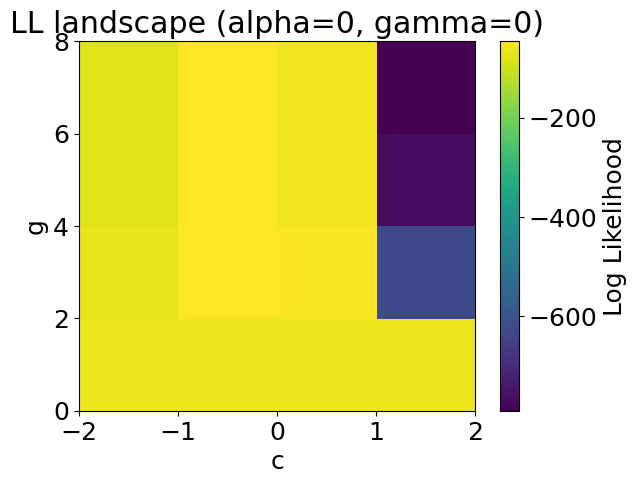

In [16]:
print("best_LL_base:", best_LL_base)
print("best_g_base:", best_g_base)
print("best_c_base:", best_c_base)
print("best_alpha_base:", best_alpha_base)
print("best_gamma_base:", best_gamma_base)

plot_heatmap(LL_matrix_base[:,:,0,0], c_values, g_values, 'c', 'g', f'LL landscape (alpha={0}, gamma={0})')

best_LL_P: -32.222005124258395
best_g_P: 5.333333333333333
best_c_P: 0.6666666666666665
best_alpha_P: 1.3333333333333333
best_gamma_P: -3.0


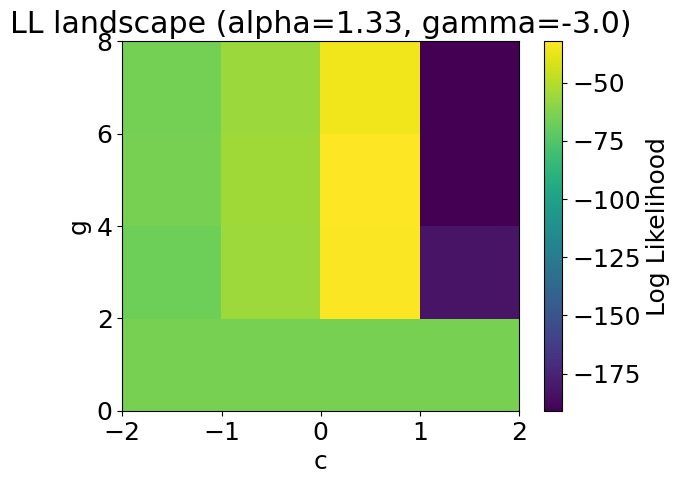

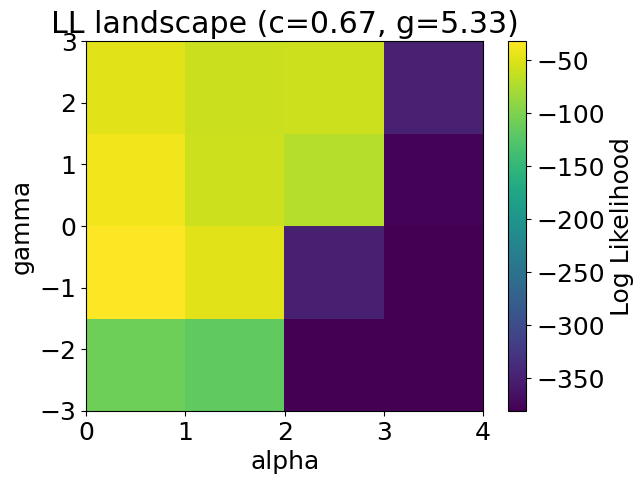

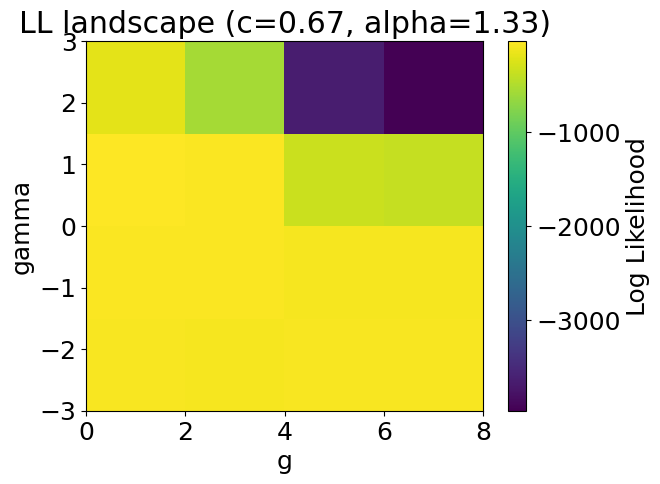

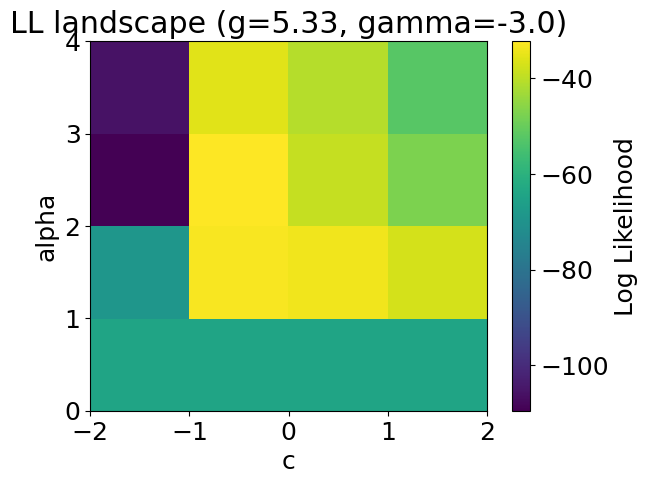

In [29]:
print("best_LL_P:", best_LL_P)
print("best_g_P:", best_g_P)
print("best_c_P:", best_c_P)
print("best_alpha_P:", best_alpha_P)
print("best_gamma_P:", best_gamma_P)

# Fix two parameters around the best values and plot the other two
# Example: Fix alpha and gamma, plot c and g
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_P))  # Fix alpha at best value
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_P))  # Fix gamma at best value

# Extract the 2D slice for c and g
LL_slice_c_g = LL_matrix_P[:, :, alpha_idx_fixed, gamma_idx_fixed]
plot_heatmap(LL_slice_c_g, c_values, g_values, 'c', 'g', f'LL landscape (alpha={round(best_alpha_P,2)}, gamma={round(best_gamma_P,2)})')

# Fix c and g, plot alpha and gamma
c_idx_fixed = np.argmin(np.abs(c_values - best_c_P))  # Fix c at best value
g_idx_fixed = np.argmin(np.abs(g_values - best_g_P))  # Fix g at best value

# Extract the 2D slice for alpha and gamma
LL_slice_alpha_gamma = LL_matrix_P[c_idx_fixed, g_idx_fixed, :, :]
plot_heatmap(LL_slice_alpha_gamma, alpha_values, gamma_values, 'alpha', 'gamma', f'LL landscape (c={round(best_c_P, 2)}, g={round(best_g_P, 2)})')

# Fix c and alpha, plot g and gamma
c_idx_fixed = np.argmin(np.abs(c_values - best_c_P))              # Fix c at best value
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_P))  # Fix alpha at best value

# Extract the 2D slice for g and gamma
LL_slice_g_gamma = LL_matrix_P[c_idx_fixed, :, alpha_idx_fixed, :]
plot_heatmap(LL_slice_g_gamma, g_values, gamma_values, 'g', 'gamma', f'LL landscape (c={round(best_c_P, 2)}, alpha={round(best_alpha_P, 2)})')

# Fix g and gamma, plot c and alpha
g_idx_fixed = np.argmin(np.abs(g_values - best_g_P))              # Fix g at best value
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_P))  # Fix gamma at best value

# Extract the 2D slice for c and alpha
LL_slice_c_alpha = LL_matrix_P[:, g_idx_fixed, :, gamma_idx_fixed]
plot_heatmap(LL_slice_c_alpha, c_values, alpha_values, 'c', 'alpha', f'LL landscape (g={round(best_g_P, 2)}, gamma={round(best_gamma_P, 2)})')

#### brief inspection of the fitted models, as a sanity check

Ploting first 20 trails:


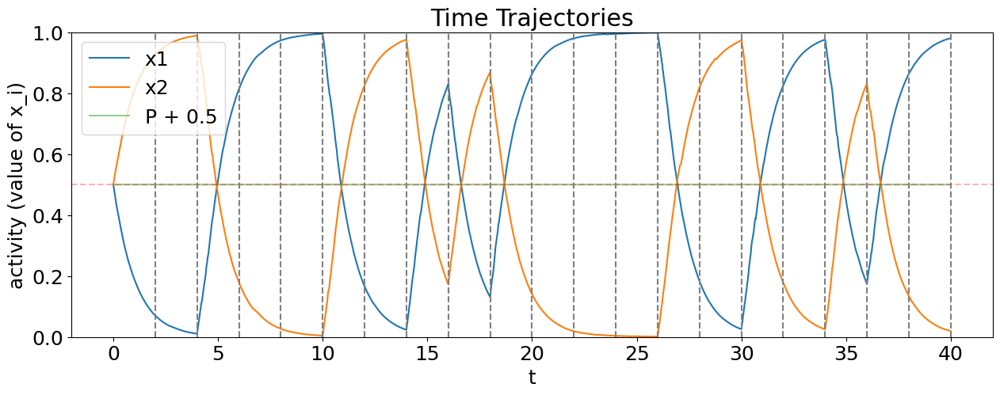

Ploting first 20 trails:


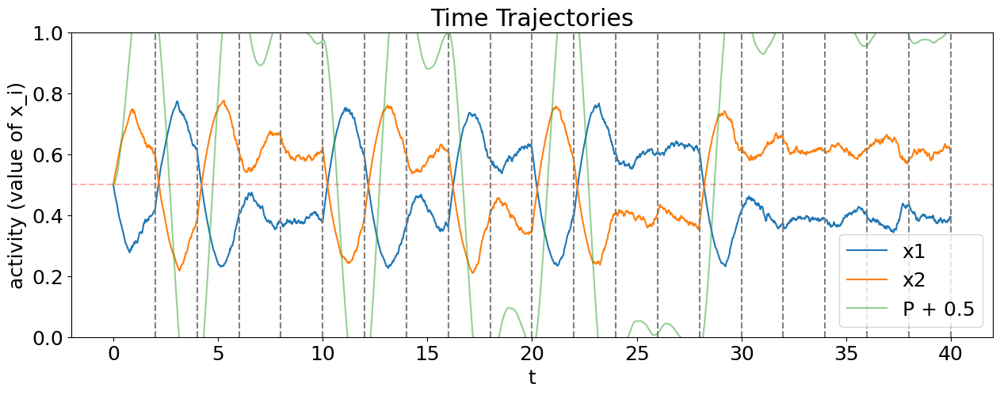

In [30]:
# simulating a small sample of trials to get an insight into the dynamics for both models
seed = 3
# num_trials = 100
# T = 2
# sigma = 0.2
# x_0 = [0.5, 0.5, 0]

# Base Model
np.random.seed(seed)
data_Base = simulate_experiment(num_trials, T, x_0, best_g_base, best_c_base, 0, 0, sigma, bool_plot_trajectory = True)

# Perseverence Model
np.random.seed(seed)
data_P = simulate_experiment(num_trials, T, x_0, best_g_P, best_c_P, best_alpha_P, best_gamma_P, sigma, bool_plot_trajectory = True)

accuracy base:  0.7272727272727273
accuracy perserverance:  0.8282828282828283
accuracy participant:  0.8924731182795699


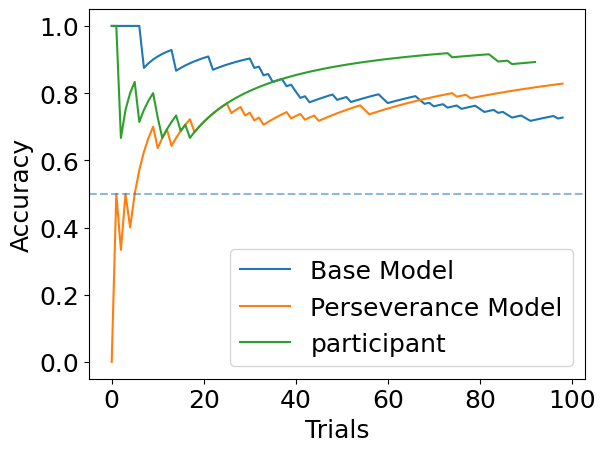

In [31]:
# plot accuary over trails for both models
print('accuracy base: ', data_Base.iloc[-1]['accuracy'])
print('accuracy perserverance: ', data_P.iloc[-1]['accuracy'])
print('accuracy participant: ', data_cleaned.iloc[-1]['accuracy'])

plt.plot(data_Base['accuracy'], label='Base Model')
plt.plot(data_P['accuracy'], label='Perseverance Model')
plt.plot(data_cleaned['accuracy'], label='participant')
plt.axhline(0.5, xmin=0, xmax=len(data_P), linestyle='--', alpha=0.5) # chance level
plt.xlabel('Trials')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [32]:
def calculate_accuracy_per_condiiton(df):
    """
    Calculates the average accuracy for switch and repeat trials.
    """
    # filter the data for switch and repeat trials
    switch_trials = df[df['trial_type'] == 'switch']
    repeat_trials = df[df['trial_type'] == 'repeat']


    # sum over response values for each condition
    sum_accuracy_switch = switch_trials['response'].sum()
    sum_accuracy_repeat = repeat_trials['response'].sum()

    # get the number of switch and repeat trials
    count_switch = len(switch_trials)
    count_repeat = len(repeat_trials)


    # calculate the average accuracy of each condition
    average_accuracy_switch = sum_accuracy_switch / count_switch if count_switch > 0 else 0
    average_accuracy_repeat = sum_accuracy_repeat / count_repeat if count_repeat > 0 else 0

    return {
        'average_accuracy_switch': average_accuracy_switch,
        'average_accuracy_repeat': average_accuracy_repeat
    }



In [33]:
compare_base = calculate_accuracy_per_condiiton(data_Base)
compare_P = calculate_accuracy_per_condiiton(data_P)
compare_participant = calculate_accuracy_per_condiiton(data_cleaned)
print(compare_base, ' (base)')
print(compare_P, ' (P)')
print(compare_participant, ' (participant)')

{'average_accuracy_switch': 0.6170212765957447, 'average_accuracy_repeat': 0.8269230769230769}  (base)
{'average_accuracy_switch': 0.7894736842105263, 'average_accuracy_repeat': 0.8809523809523809}  (P)
{'average_accuracy_switch': 0.8780487804878049, 'average_accuracy_repeat': 0.9038461538461539}  (participant)


## Parameter Recovery *(5 points)*

For this exercise you should:

*   Set up a suitable space of parameters relevant for parameter recovery *(1 point)*

*   Use the functions above to generate behavior from a models, for a given set of (randomly sampled) parameters, and then fit the model to its generated data. Make sure to evaluate the parameter fit in a quantiative manner. *(3 points)*

*   Plot the parameter recovery results for both models. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [34]:
from parameter_recovery import param_recovery

In [35]:
# Parameter Recovery
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(1)

# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
x_0 = np.array([0.5, 0.5, 0])

# Number of true values we seek to simulate and num of search values
num_true_param_set = 5
num_samples = 4

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 8
min_c, max_c = -2, 2
min_alpha, max_alpha = 0, 4
min_gamma, max_gamma = -3, 3

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# param sets/combinations to recover
to_recover_g = np.random.uniform(min_g, max_g, num_true_param_set)
to_recover_c = np.random.uniform(min_c, max_c, num_true_param_set)
to_recover_alpha = np.random.uniform(min_alpha, max_alpha, num_true_param_set)
to_recover_gamma = np.random.uniform(min_gamma, max_gamma, num_true_param_set)


fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                        g_values, c_values, np.zeros(1), np.zeros(1), sigma)
fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                        g_values, c_values, alpha_values, gamma_values, sigma)



run:   0%|          | 0/5 [00:00<?, ?it/s]

0.0 0.0


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:  20%|██        | 1/5 [00:02<00:09,  2.40s/it]

0.0 0.0


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:  40%|████      | 2/5 [00:05<00:07,  2.53s/it]

0.0 0.0


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:  60%|██████    | 3/5 [00:06<00:04,  2.22s/it]

0.0 0.0


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:  80%|████████  | 4/5 [00:09<00:02,  2.25s/it]

0.0 0.0


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

run:   0%|          | 0/5 [00:00<?, ?it/s]

1.6767780576131792 1.0228050610704136


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encount

2.740878001587038 -0.4961711857972384


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encount

0.8178089989260697 0.3521389706745097


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encount

3.5124697455637817 -2.1576783684285976


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encount

0.10955037279170465 -1.8113910654907273


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-g * net))
/home/mj/Documents/Esma/MiCNS/project/model.py:15: RuntimeWarning: overflow encount

In [36]:
from scipy.stats import pearsonr

# make a df of the results
results_base = pd.DataFrame({
    'true_g': to_recover_g,
    'true_c': to_recover_c,
    'true_alpha': np.zeros(num_true_param_set),
    'true_gamma': np.zeros(num_true_param_set),
    'fitted_g': fitted_g_log_base,
    'fitted_c': fitted_c_log_base,
    'fitted_alpha': fitted_alpha_log_base,
    'fitted_gamma': fitted_gamma_log_base,
    'LL': LL_log_base
})

results_P = pd.DataFrame({
    'true_g': to_recover_g,
    'true_c': to_recover_c,
    'true_alpha': to_recover_alpha,
    'true_gamma': to_recover_gamma,
    'fitted_g': fitted_g_log_P,
    'fitted_c': fitted_c_log_P,
    'fitted_alpha': fitted_alpha_log_P,
    'fitted_gamma': fitted_gamma_log_P,
    'LL': LL_log_P
})

# calculate the Pearson correlation coefficient for each parameter
param_names = ['g', 'c', 'alpha', 'gamma']
corr_true_fitted_base = [pearsonr(results_base[f'true_{param}'], results_base[f'fitted_{param}']) for param in param_names]
corr_true_fitted_P = [pearsonr(results_P[f'true_{param}'], results_P[f'fitted_{param}']) for param in param_names]

# parameter, correlation, p-value
corr_values_base = pd.DataFrame(corr_true_fitted_base, columns=['correlation', 'p-value'], index=param_names, dtype=float)
corr_values_base.index.name = 'parameter'
# round correlation values
corr_values_base['correlation'] = corr_values_base['correlation'].round(3)
# convert p values into scientific notation
corr_values_base['p-value'] = corr_values_base['p-value'].apply(lambda x: '%.2e' % x)

# same for the perseverence model
corr_values_P = pd.DataFrame(corr_true_fitted_P, columns=['correlation', 'p-value'], index=param_names, dtype=float)
# rename index column to parameter
corr_values_P.index.name = 'parameter'
corr_values_P['correlation'] = corr_values_P['correlation'].round(3)
corr_values_P['p-value'] = corr_values_P['p-value'].apply(lambda x: '%.2e' % x)

# calculate pairwise cross correlation between the parameters (fitted values of different parameters)
cross_corr_base = results_base[['fitted_g', 'fitted_c', 'fitted_alpha', 'fitted_gamma']].corr(method=lambda x, y: pearsonr(x, y)[0])
cross_corr_P = results_P[['fitted_g', 'fitted_c', 'fitted_alpha', 'fitted_gamma']].corr(method=lambda x, y: pearsonr(x, y)[0])

# print the results
print('Base Model:')
display(results_base)
display(corr_values_base)
display(cross_corr_base)
print('-'*50)
print('Perseverance Model:')
display(results_P)
display(corr_values_P)
display(cross_corr_P)

/tmp/ipykernel_60154/3110397697.py:30: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted_base = [pearsonr(results_base[f'true_{param}'], results_base[f'fitted_{param}']) for param in param_names]
/tmp/ipykernel_60154/3110397697.py:49: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cross_corr_base = results_base[['fitted_g', 'fitted_c', 'fitted_alpha', 'fitted_gamma']].corr(method=lambda x, y: pearsonr(x, y)[0])


Base Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,3.336176,-1.630646,0.0,0.0,8.000000,-2.000000,0.0,0.0,-61.643245
1,5.762596,-1.254959,0.0,0.0,2.666667,-0.666667,0.0,0.0,-62.686505
2,0.000915,-0.617757,0.0,0.0,0.000000,-2.000000,0.0,0.0,-68.621571
3,2.418661,-0.412930,0.0,0.0,2.666667,-0.666667,0.0,0.0,-59.406670
4,1.174047,0.155267,0.0,0.0,2.666667,-0.666667,0.0,0.0,-62.229830


,correlation,p-value
parameter,,
g,0.429,4.71e-01
c,0.483,4.10e-01
alpha,NaN,nan
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.00,-0.25,NaN,NaN
fitted_c,-0.25,1.00,NaN,NaN
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Perseverance Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,3.336176,-1.630646,1.676778,1.022805,2.666667,-2.000000,4.000000,3.0,-61.385561
1,5.762596,-1.254959,2.740878,-0.496171,8.000000,-2.000000,4.000000,-1.0,-58.962153
2,0.000915,-0.617757,0.817809,0.352139,5.333333,-0.666667,1.333333,-3.0,-65.970100
3,2.418661,-0.412930,3.512470,-2.157678,2.666667,-0.666667,2.666667,-3.0,-61.821272
4,1.174047,0.155267,0.109550,-1.811391,2.666667,-0.666667,0.000000,-3.0,-68.592065


,correlation,p-value
parameter,,
g,0.497,3.94e-01
c,0.896,3.97e-02
alpha,0.714,1.75e-01
gamma,0.709,1.80e-01


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,-0.408248,0.342997,-0.085749
fitted_c,-0.408248,1.000000,-0.840168,-0.840168
fitted_alpha,0.342997,-0.840168,1.000000,0.705882
fitted_gamma,-0.085749,-0.840168,0.705882,1.000000


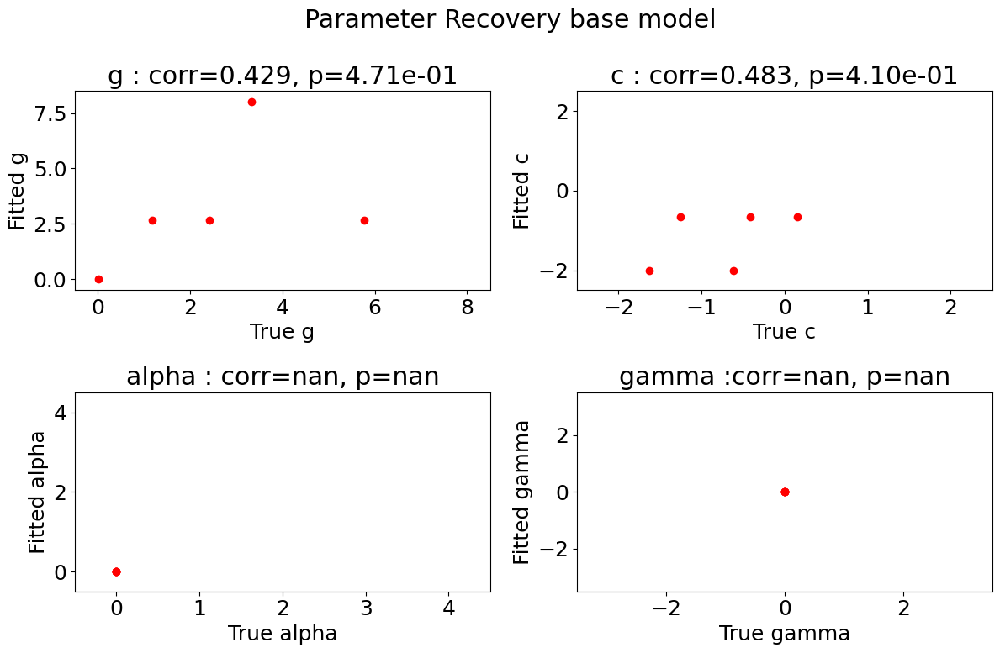

In [37]:
# plot the true to fitted parameters correlation for base model
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Adjust the figsize as needed
fig.suptitle('Parameter Recovery base model')

# set some margine to better see edge points
margin = 0.5

axes[0, 0].scatter(to_recover_g, fitted_g_log_base, marker='o', color='red')
axes[0, 0].set_xlabel('True g')
axes[0, 0].set_ylabel('Fitted g')
# use the parameter name as index
axes[0, 0].set_title(f'g : corr={corr_values_base.loc["g", "correlation"]}, p={corr_values_base.loc["g", "p-value"]}')
axes[0, 0].set_xlim([min_g - margin, max_g + margin])
axes[0, 0].set_ylim([min_g - margin, max_g + margin])
# axes[0, 0].set_aspect('equal')

axes[0, 1].scatter(to_recover_c, fitted_c_log_base, marker='o', color='red')
axes[0, 1].set_xlabel('True c')
axes[0, 1].set_ylabel('Fitted c')
axes[0, 1].set_title(f'c : corr={corr_values_base.loc["c", "correlation"]}, p={corr_values_base.loc["c", "p-value"]}')
axes[0, 1].set_xlim([min_c -margin, max_c + margin])
axes[0, 1].set_ylim([min_c -margin, max_c + margin])
# axes[0, 1].set_aspect('equal')

axes[1, 0].scatter(np.zeros(num_true_param_set), fitted_alpha_log_base, marker='o', color='red')
axes[1, 0].set_xlabel('True alpha')
axes[1, 0].set_ylabel('Fitted alpha')
axes[1, 0].set_title(f'alpha : corr={corr_values_base.loc["alpha", "correlation"]}, p={corr_values_base.loc["alpha", "p-value"]}')
axes[1, 0].set_xlim([min_alpha -margin, max_alpha + margin])
axes[1, 0].set_ylim([min_alpha -margin, max_alpha + margin])
# axes[1, 0].set_aspect('equal')

axes[1, 1].scatter(np.zeros(num_true_param_set), fitted_gamma_log_base, marker='o', color='red')
axes[1, 1].set_xlabel('True gamma')
axes[1, 1].set_ylabel('Fitted gamma')
axes[1, 1].set_title(f'gamma :corr={corr_values_base.loc["gamma", "correlation"]}, p={corr_values_base.loc["gamma", "p-value"]}')
axes[1, 1].set_xlim([min_gamma -margin, max_gamma + margin])
axes[1, 1].set_ylim([min_gamma -margin, max_gamma + margin])
# axes[1, 1].set_aspect('equal')

plt.tight_layout()
plt.show()

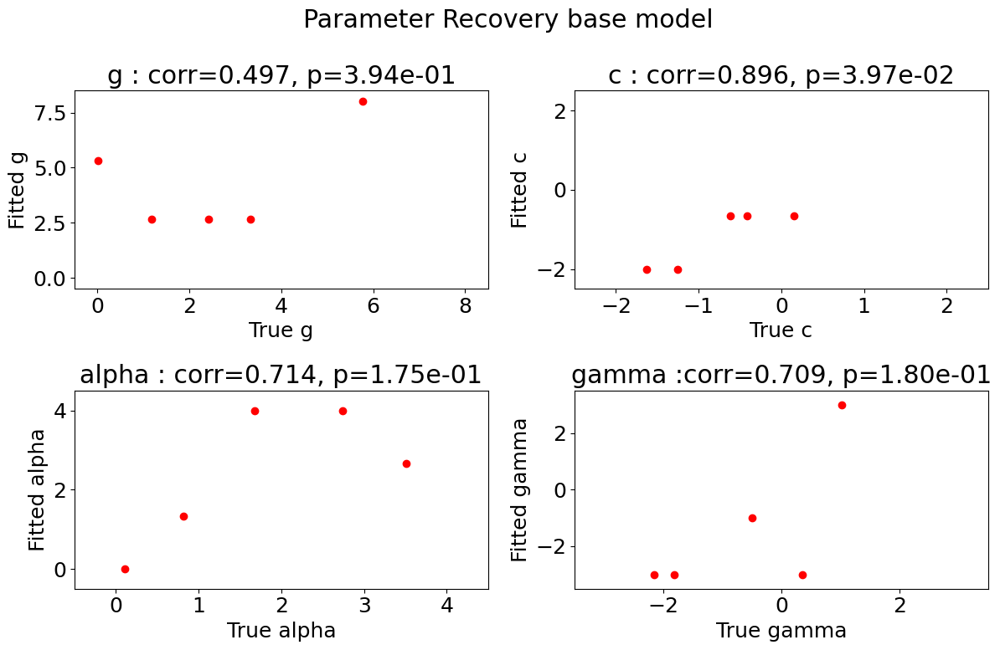

In [38]:
# plot the true to fitted parameters correlation for perseverence model
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Adjust the figsize as needed
fig.suptitle('Parameter Recovery base model')

# set some margine to better see edge points
margin = 0.5

axes[0, 0].scatter(to_recover_g, fitted_g_log_P, marker='o', color='red')
axes[0, 0].set_xlabel('True g')
axes[0, 0].set_ylabel('Fitted g')
axes[0, 0].set_title(f'g : corr={corr_values_P.loc["g", "correlation"]}, p={corr_values_P.loc["g", "p-value"]}')
axes[0, 0].set_xlim([min_g - margin, max_g + margin])
axes[0, 0].set_ylim([min_g - margin, max_g + margin])
# axes[0, 0].set_aspect('equal')

axes[0, 1].scatter(to_recover_c, fitted_c_log_P, marker='o', color='red')
axes[0, 1].set_xlabel('True c')
axes[0, 1].set_ylabel('Fitted c')
axes[0, 1].set_title(f'c : corr={corr_values_P.loc["c", "correlation"]}, p={corr_values_P.loc["c", "p-value"]}')
axes[0, 1].set_xlim([min_c -margin, max_c + margin])
axes[0, 1].set_ylim([min_c -margin, max_c + margin])
# axes[0, 1].set_aspect('equal')

axes[1, 0].scatter(to_recover_alpha, fitted_alpha_log_P, marker='o', color='red')
axes[1, 0].set_xlabel('True alpha')
axes[1, 0].set_ylabel('Fitted alpha')
axes[1, 0].set_title(f'alpha : corr={corr_values_P.loc["alpha", "correlation"]}, p={corr_values_P.loc["alpha", "p-value"]}')
axes[1, 0].set_xlim([min_alpha -margin, max_alpha + margin])
axes[1, 0].set_ylim([min_alpha -margin, max_alpha + margin])
# axes[1, 0].set_aspect('equal')

axes[1, 1].scatter(to_recover_gamma, fitted_gamma_log_P, marker='o', color='red')
axes[1, 1].set_xlabel('True gamma')
axes[1, 1].set_ylabel('Fitted gamma')
axes[1, 1].set_title(f'gamma :corr={corr_values_P.loc["gamma", "correlation"]}, p={corr_values_P.loc["gamma", "p-value"]}')
axes[1, 1].set_xlim([min_gamma -margin, max_gamma + margin])
axes[1, 1].set_ylim([min_gamma -margin, max_gamma + margin])
# axes[1, 1].set_aspect('equal')

plt.tight_layout()
plt.show()

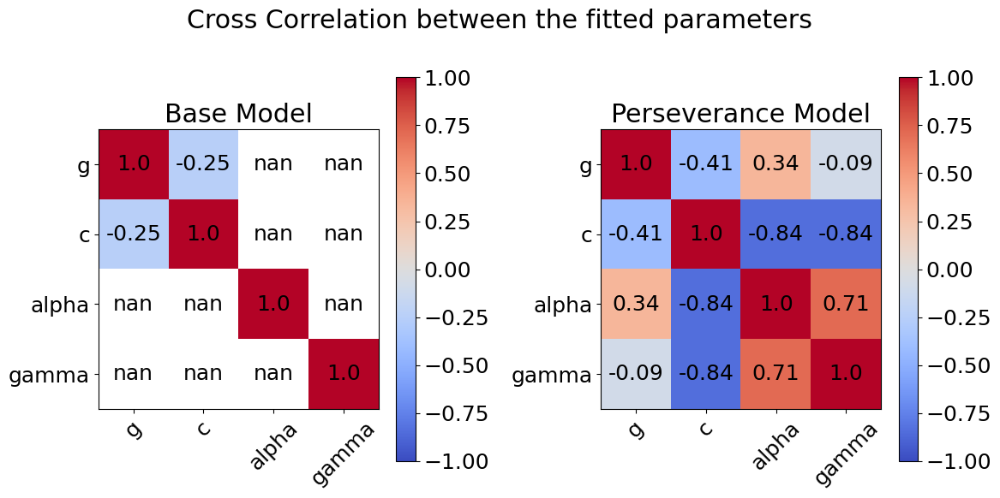

In [39]:
# plot cross correlation between the fitted parameters for both models
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Adjust the figsize as needed
fig.suptitle('Cross Correlation between the fitted parameters')

# base model
im_base = axes[0].imshow(cross_corr_base, cmap='coolwarm', vmin=-1, vmax=1)
# show correlation values
for i in range(4):
    for j in range(4):
        axes[0].text(j, i, cross_corr_base.iloc[i, j].round(2), ha='center', va='center', color='black')
axes[0].set_xticks(np.arange(4))
axes[0].set_yticks(np.arange(4))
axes[0].set_xticklabels(param_names, rotation=45)
axes[0].set_yticklabels(param_names)
axes[0].set_title('Base Model')
plt.colorbar(im_base, ax=axes[0])

# perseverence model
im_P = axes[1].imshow(cross_corr_P, cmap='coolwarm', vmin=-1, vmax=1)
for i in range(4):
    for j in range(4):
        axes[1].text(j, i, cross_corr_P.iloc[i, j].round(2), ha='center', va='center', color='black')
axes[1].set_xticks(np.arange(4))
axes[1].set_yticks(np.arange(4))
axes[1].set_xticklabels(param_names, rotation=45)
axes[1].set_yticklabels(param_names)
axes[1].set_title('Perseverance Model')
plt.colorbar(im_P, ax=axes[1])

plt.tight_layout()
plt.show()

## *Optional*: Model Recovery *(2 bonus points)*

In this bonus exercise, you may examine model reovery. The bonus points count towards your total group project points. That is, you may accumlate up to 22 points in the practical part of the group project.

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [ ]:
# YOUR MODEL RECOVERY CODE GOES HERE

## Model Comparison *(5 points)*

For this exercise you should:

*   Load and (potentially) preprocess the experimental data. (1 point)

*   Fit the two models to the data.  *(1 point)*

*   Evaluate which model performs better, taking into account fit and model complexity. *(2 points)*

*   Plot the behavior of the winning model against the data. *(1 point)**

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [ ]:
# YOUR MODEL COMPARISON CODE GOES HERE